In [1]:
import os
import sys
import argparse

import numpy as np
import pandas as pd
import torch
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc
# import scvi
import anndata

import scanpy.external as sce
# from scvi.model.utils import mde

from sklearn.metrics import classification_report
from sklearn.metrics.pairwise import cosine_similarity

import scarches
from scarches.dataset.trvae.data_handling import remove_sparsity
from scarches.models.scpoli import scPoli

/home/theislab/l_zadeh/.conda/envs/scarches_latest/lib/python3.9/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/theislab/l_zadeh/.conda/envs/scarches_latest/lib/python3.9/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
/home/theislab/l_zadeh/.conda/envs/scarches_latest/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
 captum (see https://github.com/pytorch/captum).


In [2]:
scarches.__version__

'0.5.9'

In [3]:
sc.set_figure_params(frameon=False)
sc.set_figure_params(dpi=200)
sc.set_figure_params(figsize=(8, 8))

In [4]:
adata = sc.read('../../fetal_lung/Roche/gut_merge.h5ad')
# adata = sc.read('../../fetal_lung/lung_organoid_epithelial.h5ad')

In [6]:
adata.shape

(806646, 25645)

In [7]:
adata.obs.columns

Index(['initial_size_spliced', 'initial_size_unspliced', 'initial_size',
       'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt',
       'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb',
       'pct_counts_hb', 'n_genes', 'sample_id', 'level_1', 'level_2',
       'level_3', 'sort_batch', 'Cell_type', 'n_counts', 'batch',
       'publication', 'sample_name', 'tissue', 'derive', 'detail_tissue',
       'time', 'time2', 'main_cells', 'protocol', 'tech', 'tech_detail',
       'molecular', 'gel'],
      dtype='object')

In [8]:
adata = adata[adata.obs.tissue.isin(['lung'])].copy()

In [ ]:
# read expert annotations - skip as obs_names don't match
# adata.obs['level_1_late']= pd.read_csv('../../fetal_lung/Annotation_LVL1.csv', index_col = 1)['Annotation_Lvl1']
# adata.obs['level_2_late']= pd.read_csv('../../fetal_lung/Annotation_LVL2.csv', index_col = 1)['Annotation_Lvl2']
# adata.obs['level_3_late']= pd.read_csv('../../fetal_lung/Annotation_LVL3.csv', index_col = 1)['Annotation_Lvl3']
# adata.obs['level_4_late']= pd.read_csv('../../fetal_lung/Annotation_LVL4.csv', index_col = 1)['Annotation_Lvl4']

In [13]:
pd.set_option("display.max_columns", None)
adata.obs

,initial_size_spliced,initial_size_unspliced,initial_size,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,n_genes,sample_id,level_1,level_2,level_3,sort_batch,Cell_type,n_counts,batch,publication,sample_name,tissue,derive,detail_tissue,time,time2,main_cells,protocol,tech,tech_detail,molecular,gel
cells,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AAACCCACAAAGCTAA-132,31397.0,14368.0,31397.0,6808,39508.0,4868.0,12.321555,7983.0,20.206034,1.0,0.002531,6808.0,Chan_NatCommun_2022_bronchial_organoids,epithelial,basal cells,basal cells,NaN,NaN,NaN,132,Chan_NatCommun_2022,bronchial_organoids,lung,ASC,bronchial,NaN,NaN,NaN,NaN,10x,10x_v3,NaN,NaN
AAACCCACACTGTGTA-132,24573.0,8025.0,24573.0,4675,31483.0,3729.0,11.844487,7484.0,23.771559,0.0,0.000000,4675.0,Chan_NatCommun_2022_bronchial_organoids,epithelial,club cells,club cells,NaN,NaN,NaN,132,Chan_NatCommun_2022,bronchial_organoids,lung,ASC,bronchial,NaN,NaN,NaN,NaN,10x,10x_v3,NaN,NaN
AAACCCATCCGCAGTG-132,21147.0,6246.0,21147.0,4822,26328.0,2810.0,10.673048,5713.0,21.699331,2.0,0.007596,4822.0,Chan_NatCommun_2022_bronchial_organoids,epithelial,club cells,club cells,NaN,NaN,NaN,132,Chan_NatCommun_2022,bronchial_organoids,lung,ASC,bronchial,NaN,NaN,NaN,NaN,10x,10x_v3,NaN,NaN
AAACCCATCTAGTGTG-132,8687.0,3785.0,8687.0,2726,11182.0,632.0,5.651941,3580.0,32.015739,0.0,0.000000,2726.0,Chan_NatCommun_2022_bronchial_organoids,epithelial,basal cells,basal cells,NaN,NaN,NaN,132,Chan_NatCommun_2022,bronchial_organoids,lung,ASC,bronchial,NaN,NaN,NaN,NaN,10x,10x_v3,NaN,NaN
AAACGAACAACTCCCT-132,11375.0,5798.0,11375.0,3956,14544.0,1113.0,7.652640,4326.0,29.744226,0.0,0.000000,3956.0,Chan_NatCommun_2022_bronchial_organoids,epithelial,basal cells,basal cells,NaN,NaN,NaN,132,Chan_NatCommun_2022,bronchial_organoids,lung,ASC,bronchial,NaN,NaN,NaN,NaN,10x,10x_v3,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGATCAGTCTAGCT-183,9504.0,21130.0,9504.0,4459,11821.0,2224.0,18.813974,739.0,6.251586,0.0,0.000000,4459.0,Hein_Dev_2022_Spheroids,epithelial,ciliated cells,ciliated cells,NaN,NaN,NaN,183,Hein_Dev_2022,Spheroids,lung,IPS,NaN,0day,0day,NaN,NaN,10x,10x_v3,NaN,NaN
TTTGATCCAACATACC-183,50587.0,52023.0,50587.0,8910,61103.0,1360.0,2.225750,11083.0,18.138226,5.0,0.008183,8910.0,Hein_Dev_2022_Spheroids,epithelial,alveolar type 1 (AT1) cells,alveolar type 1 (AT1) cells,NaN,NaN,NaN,183,Hein_Dev_2022,Spheroids,lung,IPS,NaN,0day,0day,NaN,NaN,10x,10x_v3,NaN,NaN
TTTGGAGAGGAGAGGC-183,9358.0,9525.0,9358.0,3935,10915.0,2025.0,18.552450,1227.0,11.241410,1.0,0.009162,3935.0,Hein_Dev_2022_Spheroids,epithelial,stem cells,stem cells,NaN,NaN,NaN,183,Hein_Dev_2022,Spheroids,lung,IPS,NaN,0day,0day,NaN,NaN,10x,10x_v3,NaN,NaN


In [15]:
sc.pp.highly_variable_genes(adata,
                            n_top_genes=3000, 
                            batch_key='publication',
                            flavor='seurat_v3', 
                            subset=True)

# replace with genes from Quan (selected from tissue)
# markers = pd.read_table('../../fetal_lung/lung_exp_avg.csv', index_col=0, delimiter='\t')
# markers = markers.index

# adata = adata[:, adata.var_names.isin(markers.values.tolist())].copy()
# adata

In [17]:
len(set(adata.obs.publication))

13

In [18]:
early_stopping_kwargs = {
    "early_stopping_metric": "val_prototype_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}

In [19]:
scpoli_model = scPoli(
        adata=adata,
        latent_dim= 30,
        unknown_ct_names=['na'],
        condition_keys=['sample_id'],
        cell_type_keys=['level_2'],
        embedding_dims=10,
        hidden_layer_sizes=[512, 512],
        recon_loss='nb'
    )

scpoli_model.train(
    n_epochs=300,
    pretraining_epochs=4,
    early_stopping_kwargs=early_stopping_kwargs,
    eta=10,
    alpha_epoch_anneal=100
)

Embedding dictionary:
 	Num conditions: [52]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 3000 512 10
	Hidden Layer 1 in/out: 512 512
	Mean/Var Layer in/out: 512 30
Decoder Architecture:
	First Layer in, out and cond:  30 512 10
	Hidden Layer 1 in/out: 512 512
	Output Layer in/out:  512 3000 

Initializing dataloaders
Starting training
 |--------------------| 1.3%  - val_loss: 1007.63 - val_cvae_loss: 1007.63
Initializing unlabeled prototypes with Leiden with an unknown number of  clusters.


/home/theislab/l_zadeh/.conda/envs/scarches_latest/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/theislab/l_zadeh/.conda/envs/scarches_latest/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/theislab/l_zadeh/.conda/envs/scarc

Clustering succesful. Found 56 clusters.
 |████----------------| 20.0%  - val_loss: 1093.22 - val_cvae_loss: 1072.42 - val_prototype_loss:   20.80 - val_unlabeled_loss:    2.84 - val_labeled_loss:    2.08
ADJUSTED LR
 |████----------------| 22.3%  - val_loss: 1083.85 - val_cvae_loss: 1063.40 - val_prototype_loss:   20.45 - val_unlabeled_loss:    2.82 - val_labeled_loss:    2.05
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.


In [20]:
scpoli_model.save("models/scpoli_lung_epithelial_organoid_batch_sampleID_3kHVGsample_id_11072023_newdata")

### Batch embedding

In [ ]:
conditional_embeddings = scpoli_model.get_conditional_embeddings()
conditional_embeddings

In [ ]:
mdata = adata_full.obs
mdata.index = mdata['sample_id'].values
mdata.drop_duplicates(subset = ['sample_id'] ,inplace=True)

In [ ]:
dup_attr = ['publication','sample','sample_id']
sample_metadata.drop(columns = dup_attr, inplace=True)
mdata = pd.concat((mdata, sample_metadata), axis = 1)

In [ ]:
conditional_embeddings.obs = mdata

In [ ]:
sc.pp.pca(conditional_embeddings)

In [ ]:
sc.set_figure_params(figsize=(5, 5))

sc.pl.embedding(conditional_embeddings, 
                basis = 'X_pca',
          components=['1,2'],
          color=['publication','time','derive','tech_detail'], 
                size = 300,
#           ncols=4, 
          ncols=2, 
                legend_fontsize='small',
          wspace = 0.5,
#           legend_loc = 'bottom margin',
#           save = '_sample_embeddings_PC12_Su_covid_allCovidStates.png'
         )

In [ ]:
sc.pl.embedding(conditional_embeddings, 
                basis = 'X_pca',
          components=['2,3'],
          color=['publication',], 
                size = 500,
#           ncols=4, 
          ncols=1, 
#                 legend_fontsize='x-small'
#           wspace = 0.75,
#           legend_loc = 'bottom margin',
#           save = '_sample_embeddings_PC12_Su_covid_allCovidStates.png'
         )

In [ ]:
sc.pl.embedding(conditional_embeddings, 
                basis = 'X_pca',
          components=['5,6'],
          color=['publication',], 
                size = 500,
#           ncols=4, 
          ncols=1, 
#                 legend_fontsize='x-small'
#           wspace = 0.75,
#           legend_loc = 'bottom margin',
#           save = '_sample_embeddings_PC12_Su_covid_allCovidStates.png'
         )

In [ ]:
sc.pl.embedding(conditional_embeddings, 
                basis = 'X_pca',
          components=['1,2'],
          color=['sample_id'], 
                size = 500,
#           ncols=4, 
          ncols=1, 
                legend_fontsize='x-small'
#           wspace = 0.75,
#           legend_loc = 'bottom margin',
#           save = '_sample_embeddings_PC12_Su_covid_allCovidStates.png'
         )

In [ ]:
sc.pl.embedding(conditional_embeddings, 
                basis = 'X_pca',
          components=['1,2'],
          color=['batch'], 
                size = 500,
#           ncols=4, 
          ncols=1, 
#                 legend_fontsize='x-small'
#           wspace = 0.75,
#           legend_loc = 'bottom margin',
#           save = '_sample_embeddings_PC12_Su_covid_allCovidStates.png'
         )

### Cell embedding

In [21]:
model_path = "models/scpoli_lung_epithelial_organoid_batch_sampleID_3kHVGsample_id_11072023_newdata"
scpoli_model = scarches.models.scpoli.scPoli.load(model_path, adata)

AnnData object with n_obs × n_vars = 225487 × 3000
    obs: 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'sample_id', 'level_1', 'level_2', 'level_3', 'sort_batch', 'Cell_type', 'n_counts', 'batch', 'publication', 'sample_name', 'tissue', 'derive', 'detail_tissue', 'time', 'time2', 'main_cells', 'protocol', 'tech', 'tech_detail', 'molecular', 'gel', 'conditions_combined'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg'
    layers: 'ambiguous', 'spliced', 'unspliced'
Embedding dictionary:
 	Num conditions: [52]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 3000 512 10
	Hidden Layer 1 in/out: 512 512
	Mean/Var Layer in/out: 512 30
Decoder Architecture:
	First Layer in, out and cond:  30 512 10
	Hid

In [22]:
embd_ref = sc.AnnData(scpoli_model.get_latent(
        adata,
        mean=True
    ))

embd_ref.obs_names = adata.obs_names
embd_ref.obs = adata.obs.copy()

/home/theislab/l_zadeh/.conda/envs/scarches_latest/lib/python3.9/site-packages/scarches/models/scpoli/scpoli_model.py:344: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /opt/conda/conda-bld/pytorch_1682343964576/work/torch/csrc/utils/tensor_new.cpp:245.)
  c = torch.tensor(label_tensor, device=device).T


In [23]:
import umap
model = umap.UMAP(n_neighbors=5, random_state=42, min_dist=0.5).fit(embd_ref.X)
embd_ref.obsm['X_umap'] = model.transform(embd_ref.X)
embd_ref.obs['source'] = 'LOA'

In [25]:
# Add proliferation/cell cycle markers - Skip

# adata_ = sc.read('../../fetal_lung/lung_organoid_epithelial.h5ad')
# markers = ['E2F1','MYBL2','BUB1','PLK1','CCNE1','CCND1','CCNB1']
# markers = [x for x in markers if x in adata_.var_names]

# adata_markers = adata_[:, adata_.var_names.isin(markers) ].copy()
# sc.pp.normalize_total(adata_markers, target_sum=1e6)
# sc.pp.log1p(adata_markers)
# adata_markers = adata_markers.to_df()
# embd.obs = pd.concat((embd.obs, adata_markers), axis = 1)


markers = ['EPCAM','PLCG2','LGR5','OLFM4','ASCL2','TP63','KRT8','KRT14',
          'FOXJ1','MUC5AC','MUC5B','SCGB1A1','CC10','SFTPC','SFTPB',
          'PDPN','HOPX','CHGA','ASCL1','SCGB3A2']


markers = [x for x in markers if x in adata.var_names]

adata_markers = adata[:, adata.var_names.isin(markers) ].copy()
sc.pp.normalize_total(adata_markers, target_sum=1e6)
sc.pp.log1p(adata_markers)
adata_markers = adata_markers.to_df()
embd_ref.obs = pd.concat((embd_ref.obs, adata_markers), axis = 1)

In [26]:
markers

['PLCG2',
 'LGR5',
 'OLFM4',
 'KRT14',
 'FOXJ1',
 'MUC5AC',
 'MUC5B',
 'SCGB1A1',
 'SFTPC',
 'SFTPB',
 'HOPX',
 'CHGA',
 'ASCL1',
 'SCGB3A2']

In [ ]:
# sc.pp.neighbors(embd_ref)
# sc.tl.umap(embd_ref)

In [27]:
sc.set_figure_params(figsize=(4, 4))

In [ ]:
# adata.obs

In [28]:
embd_ref.obs

,initial_size_spliced,initial_size_unspliced,initial_size,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,n_genes,sample_id,level_1,level_2,level_3,sort_batch,Cell_type,n_counts,batch,publication,sample_name,tissue,derive,detail_tissue,time,time2,main_cells,protocol,tech,tech_detail,molecular,gel,conditions_combined,source,ASCL1,CHGA,FOXJ1,HOPX,KRT14,LGR5,MUC5AC,MUC5B,OLFM4,PLCG2,SCGB1A1,SCGB3A2,SFTPB,SFTPC
cells,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AAACCCACAAAGCTAA-132,31397.0,14368.0,31397.0,6808,39508.0,4868.0,12.321555,7983.0,20.206034,1.0,0.002531,6808.0,Chan_NatCommun_2022_bronchial_organoids,epithelial,basal cells,basal cells,NaN,NaN,NaN,132,Chan_NatCommun_2022,bronchial_organoids,lung,ASC,bronchial,NaN,NaN,NaN,NaN,10x,10x_v3,NaN,NaN,NaN,LOA,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,13.815512,0.0,0.0,0.0
AAACCCACACTGTGTA-132,24573.0,8025.0,24573.0,4675,31483.0,3729.0,11.844487,7484.0,23.771559,0.0,0.000000,4675.0,Chan_NatCommun_2022_bronchial_organoids,epithelial,club cells,club cells,NaN,NaN,NaN,132,Chan_NatCommun_2022,bronchial_organoids,lung,ASC,bronchial,NaN,NaN,NaN,NaN,10x,10x_v3,NaN,NaN,NaN,LOA,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,6.212125,13.815014,0.0,0.0,0.0
AAACCCATCCGCAGTG-132,21147.0,6246.0,21147.0,4822,26328.0,2810.0,10.673048,5713.0,21.699331,2.0,0.007596,4822.0,Chan_NatCommun_2022_bronchial_organoids,epithelial,club cells,club cells,NaN,NaN,NaN,132,Chan_NatCommun_2022,bronchial_organoids,lung,ASC,bronchial,NaN,NaN,NaN,NaN,10x,10x_v3,NaN,NaN,NaN,LOA,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,7.715638,13.813267,0.0,0.0,0.0
AAACCCATCTAGTGTG-132,8687.0,3785.0,8687.0,2726,11182.0,632.0,5.651941,3580.0,32.015739,0.0,0.000000,2726.0,Chan_NatCommun_2022_bronchial_organoids,epithelial,basal cells,basal cells,NaN,NaN,NaN,132,Chan_NatCommun_2022,bronchial_organoids,lung,ASC,bronchial,NaN,NaN,NaN,NaN,10x,10x_v3,NaN,NaN,NaN,LOA,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,13.815512,0.0,0.0,0.0
AAACGAACAACTCCCT-132,11375.0,5798.0,11375.0,3956,14544.0,1113.0,7.652640,4326.0,29.744226,0.0,0.000000,3956.0,Chan_NatCommun_2022_bronchial_organoids,epithelial,basal cells,basal cells,NaN,NaN,NaN,132,Chan_NatCommun_2022,bronchial_organoids,lung,ASC,bronchial,NaN,NaN,NaN,NaN,10x,10x_v3,NaN,NaN,NaN,LOA,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,10.982314,13.754887,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGATCAGTCTAGCT-183,9504.0,21130.0,9504.0,4459,11821.0,2224.0,18.813974,739.0,6.251586,0.0,0.000000,4459.0,Hein_Dev_2022_Spheroids,epithelial,ciliated cells,ciliated cells,NaN,NaN,NaN,183,Hein_Dev_2022,Spheroids,lung,IPS,NaN,0day,0day,NaN,NaN,10x,10x_v3,NaN,NaN,NaN,LOA,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
TTTGATCCAACATACC-183,50587.0,52023.0,50587.0,8910,61103.0,1360.0,2.225750,11083.0,18.138226,5.0,0.008183,8910.0,Hein_Dev_2022_Spheroids,epithelial,alveolar type 1 (AT1) cells,alveolar type 1 (AT1) cells,NaN,NaN,NaN,183,Hein_Dev_2022,Spheroids,lung,IPS,NaN,0day,0day,NaN,NaN,10x,10x_v3,NaN,NaN,NaN,LOA,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
TTTGGAGAGGAGAGGC-183,9358.0,9525.0,9358.0,3935,10915.0,2025.0,18.552450,1227.0,11.241410,1.0,0.009162,3935.0,Hein_Dev_2022_Spheroids,epithelial,stem cells,stem cells,NaN,NaN,NaN,183,Hein_Dev_2022,Spheroids,lung,IPS,NaN,0day,0day,NaN,NaN,10x,10x_v3,NaN,NaN,NaN,LOA,0.0,0.0,0.0,0.0,0.0,13.815512,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0


In [106]:
embd_ref

AnnData object with n_obs × n_vars = 225487 × 30
    obs: 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'sample_id', 'level_1', 'level_2', 'level_3', 'sort_batch', 'Cell_type', 'n_counts', 'batch', 'publication', 'sample_name', 'tissue', 'derive', 'detail_tissue', 'time', 'time2', 'main_cells', 'protocol', 'tech', 'tech_detail', 'molecular', 'gel', 'conditions_combined', 'source', 'ASCL1', 'CHGA', 'FOXJ1', 'HOPX', 'KRT14', 'LGR5', 'MUC5AC', 'MUC5B', 'OLFM4', 'PLCG2', 'SCGB1A1', 'SCGB3A2', 'SFTPB', 'SFTPC'
    uns: 'level_1_colors', 'level_2_colors', 'level_3_colors', 'tissue_colors', 'derive_colors', 'publication_colors', 'sample_id_colors', 'Cell_type_colors', 'time_colors', 'tech_detail_colors'
    obsm: 'X_umap'

In [29]:
# map colors
col_map = pd.read_table('gut_scpoli_color.txt', header=None, index_col=0)
col_map = dict(zip(col_map.index, col_map[1]))

embd_ref.uns['level_1_colors'] = embd_ref.obs.level_1.cat.categories.map(col_map).tolist()
embd_ref.uns['level_2_colors'] = embd_ref.obs.level_2.cat.categories.map(col_map).tolist()
embd_ref.uns['level_3_colors'] = embd_ref.obs.level_3.cat.categories.map(col_map).tolist()
embd_ref.uns['tissue_colors'] = embd_ref.obs.tissue.cat.categories.map(col_map).tolist()
embd_ref.uns['derive_colors'] = embd_ref.obs.derive.cat.categories.map(col_map).tolist()

/home/theislab/l_zadeh/.conda/envs/scarches_latest/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/theislab/l_zadeh/.conda/envs/scarches_latest/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/theislab/l_zadeh/.conda/envs/scarches_latest/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/theislab/l_zadeh/.conda/envs/scarches_latest/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


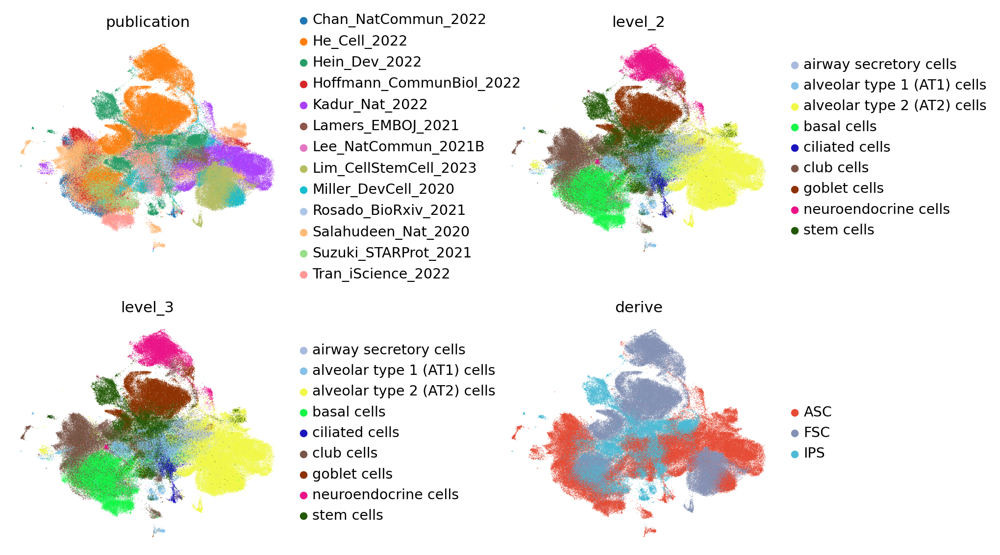

In [104]:
sc.pl.umap(embd_ref, color=["publication", "level_2", "level_3","derive"], 
           size = 1,
                            wspace = 0.6, ncols=2, frameon=False, show=True, 
          save = 'lung_organid_new_data_nbloss_hvgpublication.png')

/home/theislab/l_zadeh/.conda/envs/scarches_latest/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/theislab/l_zadeh/.conda/envs/scarches_latest/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


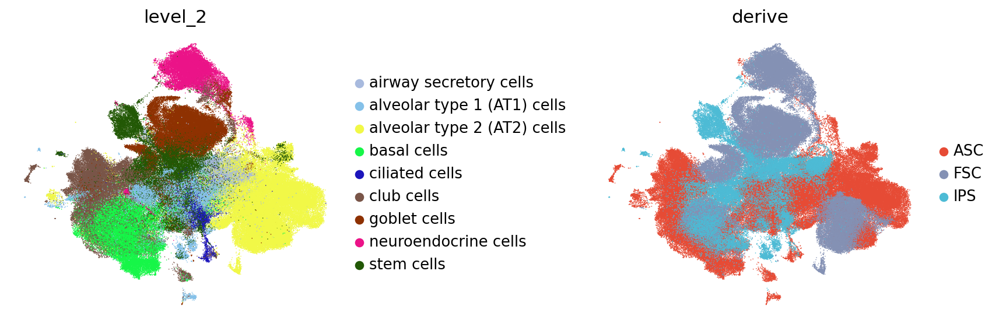

In [105]:
sc.pl.umap(embd_ref, color=[ "level_2","derive"], 
           size = 2, legend_fontsize='small',
                            wspace = 0.6, ncols=2, frameon=False, show=True, 
          save = 'lung_organid_new_data_nbloss_hvgPublication_ann_celltype_derive.png')

/home/theislab/l_zadeh/.conda/envs/scarches_latest/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


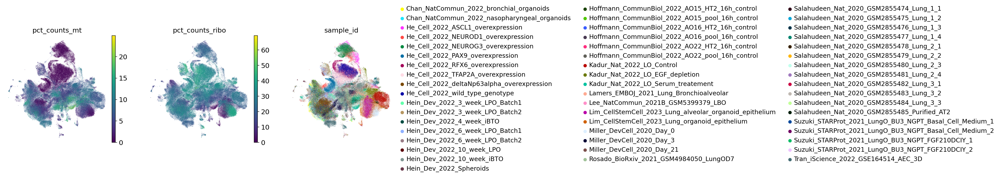

In [107]:
sc.pl.umap(embd_ref, color=['pct_counts_mt',  'pct_counts_ribo', 'sample_id'], 
                            ncols=3, frameon=False, show=True)

/home/theislab/l_zadeh/.conda/envs/scarches_latest/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/theislab/l_zadeh/.conda/envs/scarches_latest/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


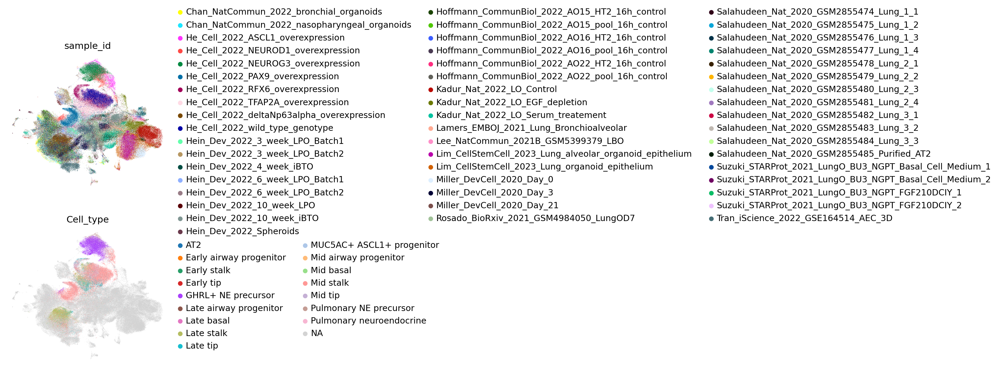

In [33]:
sc.pl.umap(embd_ref, color=['sample_id', 'Cell_type'], 
                            ncols=1, frameon=False, show=True)

/home/theislab/l_zadeh/.conda/envs/scarches_latest/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


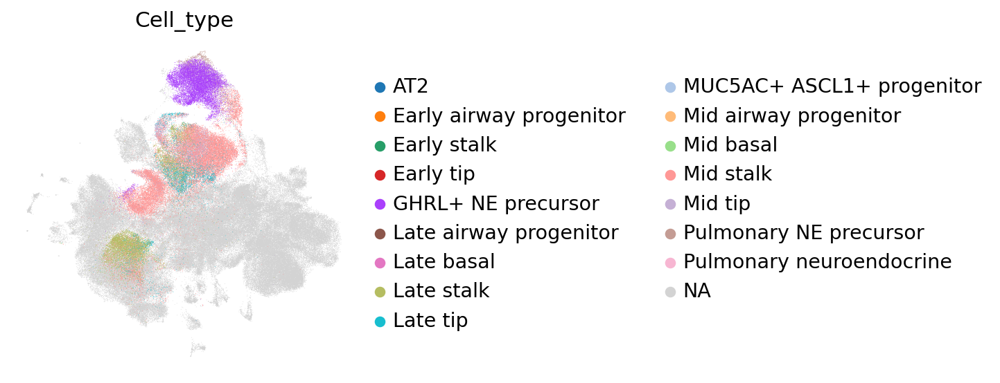

In [34]:
sc.pl.umap(embd_ref, color=['Cell_type'], 
                            ncols=1, frameon=False, show=True)

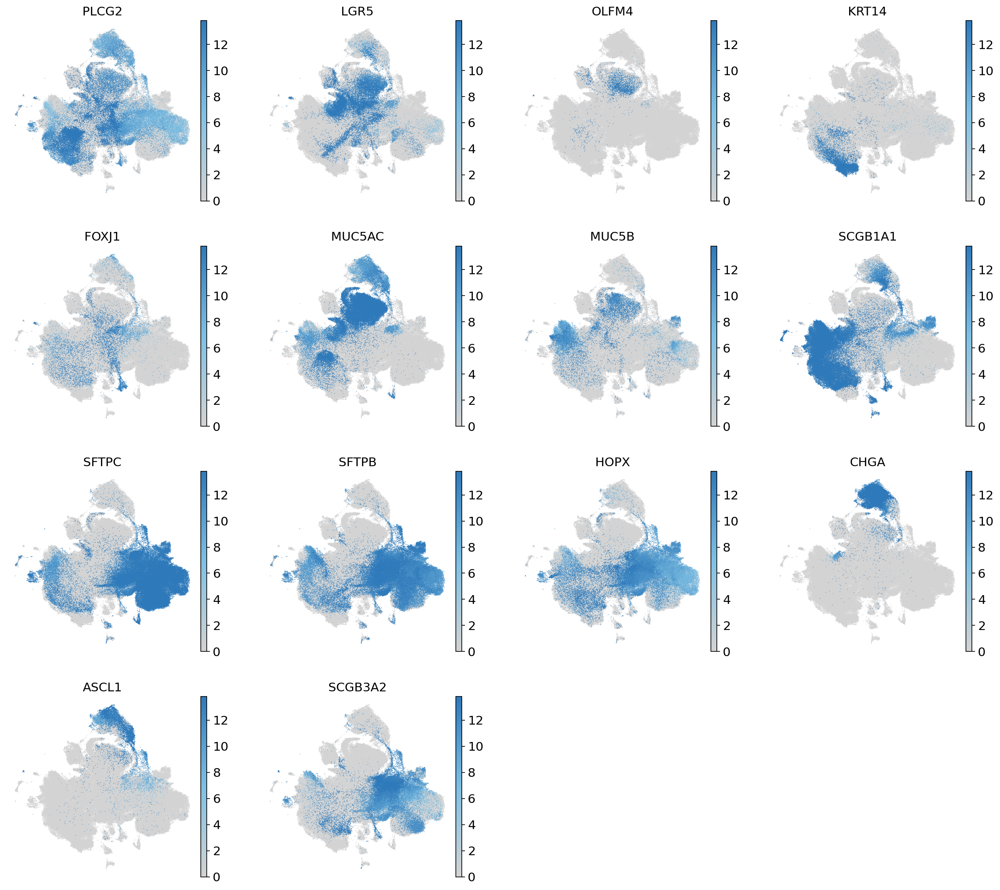

In [92]:
# colors2 = plt.cm.Blues(np.linspace(0, 1, 128))
# colorsComb = np.vstack([colors2])
# mymap = mpl.colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)
# my_cmap2 = mymap(np.arange(mymap.N))
# my_cmap2[:,-1] = np.linspace(0, 1, mymap.N)
# my_cmap2 = mpl.colors.ListedColormap(my_cmap2)


cmap = mpl.colors.LinearSegmentedColormap.from_list("", ["lightgray",'#7ec0e4','#2e79ba'])


gns = mpl.cm.Blues
gns.set_bad('lightgray')
gns.set_under('lightgray')

sc.pl.umap(embd_ref, color=markers, size =2,
           color_map=cmap, #gns, #cmap, #my_cmap2, #mpl.colormaps['Blues'],
                            ncols=4, frameon=False, show=True,
          save = 'lung_organid_new_data_nbloss_hvgPublication_ann_lungmarkers.png')

In [93]:
# sc.pl.umap(embd, color=markers, 
#                             ncols=3, frameon=False, show=True)

In [94]:
# # add metadata to cell embedding for export - skip . new object has this info
# sample_data =  sample_data.reindex(adata_full.obs.sample_id)
# sample_data.index = embd.obs_names
# embd.obs = pd.concat((embd.obs, sample_data), axis = 1)

In [95]:
# embd.obs.protocol.value_counts()

/home/theislab/l_zadeh/.conda/envs/scarches_latest/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/theislab/l_zadeh/.conda/envs/scarches_latest/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/theislab/l_zadeh/.conda/envs/scarches_latest/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


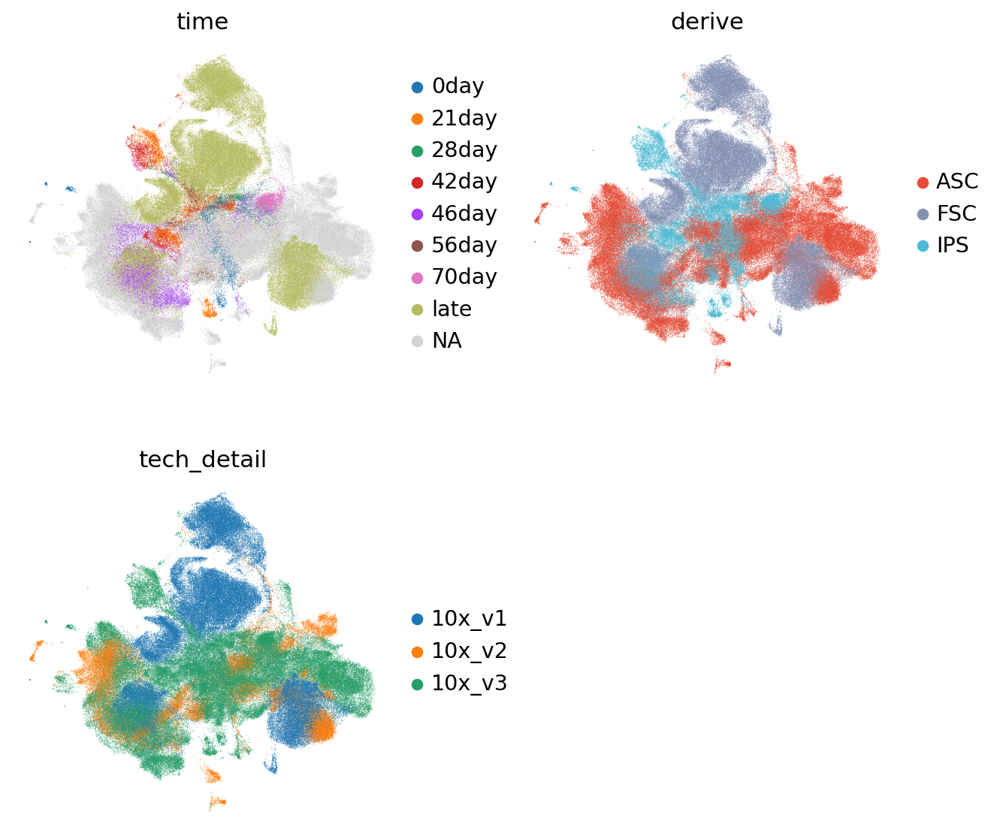

In [96]:
sc.pl.umap(embd_ref, color=[ 'time','derive','tech_detail' ], 
                            ncols=2, frameon=False, show=True)

In [ ]:
# embd_ref.obs['conditions_combined'] = embd_ref.obs.conditions_combined.astype('str')
# embd_ref.obs['main_cells'] = embd_ref.obs.main_cells.astype('str')
# embd_ref.obs['protocol'] = embd_ref.obs.protocol.astype('str')
# embd_ref.obs['molecular'] = embd_ref.obs.molecular.astype('str')
# embd_ref.obs['gel'] = embd_ref.obs.gel.astype('str')

In [99]:
adata.obsm['X_umap'] = embd_ref.X

In [102]:
adata.obs['conditions_combined'] = adata.obs.conditions_combined.astype('str')
adata.obs['main_cells'] = adata.obs.main_cells.astype('str')
adata.obs['protocol'] = adata.obs.protocol.astype('str')
adata.obs['molecular'] = adata.obs.molecular.astype('str')
adata.obs['gel'] = adata.obs.gel.astype('str')

In [109]:
del adata.var

In [111]:
del adata.layers

In [113]:
del adata.uns

In [114]:
adata

AnnData object with n_obs × n_vars = 225487 × 3000
    obs: 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'sample_id', 'level_1', 'level_2', 'level_3', 'sort_batch', 'Cell_type', 'n_counts', 'batch', 'publication', 'sample_name', 'tissue', 'derive', 'detail_tissue', 'time', 'time2', 'main_cells', 'protocol', 'tech', 'tech_detail', 'molecular', 'gel', 'conditions_combined'
    obsm: 'X_umap'

In [115]:
adata.write('lung_heoa_3khvg.h5ad')

In [ ]:
# embd.write('embeddings/epithelial_lung_organoid_latent__model__scpoli_integration_lung_organoid_sampelD_as_batch_3kFeatures.h5ad')

### Map Alveolar Differentiation timecourse data 

In [ ]:
adata = sc.read('../../fetal_lung/AlveolarDifferentiationD0D1D6D21.h5ad')
adata_airway = sc.read('../../fetal_lung/AirwayDifferentiationD35D56.h5ad')


adata_airway.obs = adata_airway.obs.drop(columns = ['orig.ident'])
adata_airway.obs.rename(columns = {'timing':'group','ID':'orig.ident'}, inplace=True)

In [ ]:
adata.obs['sample_id'] = adata.obs['orig.ident']
adata.obs['level_1'] = 'na'
adata.obs['level_2'] = 'na'
adata.obs['derive'] = 'FSC (query)'
adata.obs['tissue'] = 'lung (query)'
adata.obs['time'] = adata.obs.group + '(query)'

In [ ]:
import anndata
from anndata import AnnData
from scipy.sparse import csr_matrix


genes_to_add = adata_full.var_names.difference(adata.var_names)
needs_padding = len(genes_to_add) > 0
if needs_padding:
    adata_padding = AnnData(
        csr_matrix(np.zeros((adata.n_obs, len(genes_to_add))))
    )
    adata_padding.var_names = genes_to_add
    adata_padding.obs_names = adata.obs_names
    # Concatenate object
    adata_out = anndata.concat(
        [adata[:,adata.var_names.intersection(adata_full.var_names)], adata_padding],
        axis=1,
        join="outer",
        index_unique=None,
        merge="unique",
    )
if not adata_full.var_names.equals(adata_out.var_names):
    adata_out._inplace_subset_var(adata_full.var_names)

In [ ]:
adata = adata_out.copy()

In [ ]:
print(adata_full.shape)
print(adata.shape)

In [ ]:
adata.layers['counts'] = adata.X.copy()

In [ ]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [ ]:
adata.X = adata.X.astype(np.float32)

In [ ]:
scpoli_query = scPoli.load_query_data(
        adata=adata,
        reference_model=scpoli_model,
        unknown_ct_names = ['na'],
        labeled_indices=[],
    )

In [ ]:
scpoli_query.train(
    n_epochs=20,
    pretraining_epochs=4,
    early_stopping_kwargs=early_stopping_kwargs,
    eta=10,
    alpha_epoch_anneal=100
)

In [ ]:
# scpoli_query.model.eval()
# embd = scpoli_query.get_latent(
#        adata_full,
#         mean=True
#     )

# embd = sc.AnnData(embd)
# embd.obs_names = adata_full.obs_names
# embd.obs = adata_full.obs.copy()
# embd.obs['source'] = 'LOA'

embd_ref.obs['source'] = 'LOA'

In [ ]:
embd_query = scpoli_query.get_latent(
       adata,
        mean=True
    )
embd_query = sc.AnnData(embd_query)
embd_query.obs_names = adata.obs_names
embd_query.obs = adata.obs.copy()
embd_query.obs['source'] = 'AlveolarDifferentiationD0D1D6D21 (query)'

In [ ]:
# embd.obs['level_1'] = embd.obs.level_1.astype('str')
# embd.obs['level_2'] = embd.obs.level_2.astype('str')
# embd.obs['sample_id'] = embd.obs.sample_id.astype('str')
# embd.obs['tissue'] = embd.obs.tissue.astype('str')
# embd.obs['derive'] = embd.obs.derive.astype('str')
# embd.obs['time'] = embd.obs.time.astype('str')

In [ ]:
# embd.obs.dtypes

In [ ]:
# embd_query.obs['level_1'] = embd_query.obs.level_1.astype('str')
# embd_query.obs['level_2'] = embd_query.obs.level_2.astype('str')
# embd_query.obs['sample_id'] = embd_query.obs.sample_id.astype('str')
# embd_query.obs['tissue'] = embd_query.obs.tissue.astype('str')
# embd_query.obs['derive'] = embd_query.obs.derive.astype('str')
# embd_query.obs['time'] = embd_query.obs.time.astype('str')

In [ ]:
import anndata as ad

# embd = ad.concat((embd,embd_query))

In [ ]:

embd_query.obsm['X_umap'] = model.transform(embd_query.X)
embd = ad.concat((embd_ref,embd_query), join = 'outer')


In [ ]:
# or concatenate pre-computed embedding
# embd = sc.AnnData(scpoli_model.get_latent(
#         adata_full,
#         mean=True
#     ))

# embd.obs_names = adata_full.obs_names
# embd.obs = adata_full.obs.copy()
# embd.obs['source'] = 'reference_organoid'

# embd = ad.concat((embd,embd_query))

In [ ]:
embd.obs

In [ ]:
# sc.pp.neighbors(embd)
# sc.tl.umap(embd)

In [ ]:
embd.obs['level_1'] = embd.obs.level_1.astype('category')
embd.obs['level_2'] = embd.obs.level_2.astype('category')
# embd.uns['level_3'] = embd.obs.level_3.astype('category')
embd.obs['tissue'] = embd.obs.tissue.astype('category')
embd.obs['derive'] = embd.obs.derive.astype('category')

In [ ]:
embd.obs['time'] = embd.obs.time.astype('category')

In [ ]:
col_map['na']= 'orange' #'#AE4DDD',
time_col_map = dict(zip(embd.obs.time.cat.categories.tolist(), ['#83afa6','#58727f','#d3a284',
                                                              '#5f1854','#1abb9c','#3b0944',
                                                              '#f30067','#6c7b95','#b5592a',
                                                              '#5e4949','#d6ec8c','#c96868']))

In [ ]:
col_map['lung (query)'] = '#535a3b'
col_map['FSC (query)'] = '#99f0ca'

In [ ]:
embd.uns['level_1_colors'] = embd.obs.level_1.cat.categories.map(col_map).tolist()
embd.uns['level_2_colors'] = embd.obs.level_2.cat.categories.map(col_map).tolist()
# embd.uns['level_3_colors'] = embd.obs.level_3.cat.categories.map(col_map).tolist()
embd.uns['tissue_colors'] = embd.obs.tissue.cat.categories.map(col_map).tolist()
embd.uns['derive_colors'] = embd.obs.derive.cat.categories.map(col_map).tolist()

In [ ]:
embd.uns['source_colors'] = ['orange','#3a7563']
embd.uns['time_colors'] = embd.obs.time.cat.categories.map(time_col_map).tolist()

In [ ]:
sc.pl.umap(embd, 
           color = ['source', 'time','tissue', 'derive','level_1','level_2'],
           ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 2, frameon=False,
           save = 'AlveolarDifferentiationD0D1D6D21_map_lungOrganoid.png'
          )

In [ ]:
sc.pl.umap(embd, 
           color = ['time',],
           ncols = 1, wspace = 0.2, legend_fontsize= 'x-small', size = 2,
           frameon=False,
          )

In [ ]:
sc.pl.umap(embd, 
           color = ['time',],
           ncols = 2, wspace = 0.2, legend_fontsize= 'x-small', size = 2,
           groups = ['Day 0(query)'], frameon=False,
           save = 'AlveolarDifferentiationD0D1D6D21_map_lungOrganoid_ann_group_d0.png'
          )

In [ ]:
sc.pl.umap(embd, 
           color = ['time',],
           ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 2,
           groups = ['Day 1(query)'], frameon=False,
           save = 'AlveolarDifferentiationD0D1D6D21_map_lungOrganoid_ann_group_d1.png'
          )

In [ ]:
sc.pl.umap(embd, 
           color = ['time',],
           ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 2,
           groups = ['Day 6(query)'], frameon=False,
           save = 'AlveolarDifferentiationD0D1D6D21_map_lungOrganoid_ann_group_d6.png'
          )

In [ ]:
sc.pl.umap(embd, 
           color = ['time',],
           ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 2,
           groups = ['Day 21(query)'], frameon=False,
           save = 'AlveolarDifferentiationD0D1D6D21_map_lungOrganoid_ann_group_d21.png'
          )

In [ ]:
sc.pl.umap(embd, 
           color = ['time',],
           ncols = 2, wspace = 0.2, legend_fontsize= 'x-small', size = 2,
           groups = ['Day 0(query)','0day'], frameon=False,
           save = 'AlveolarDifferentiationD0D1D6D21_map_lungOrganoid_ann_time_d0_queryRef.png'
          )

In [ ]:
sc.pl.umap(embd, 
           color = ['time',],
           ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 2,
           groups = ['Day 21(query)','21day'], frameon=False,
           save = 'AlveolarDifferentiationD0D1D6D21_map_lungOrganoid_ann_time_d21_queryRef.png'
          )

In [ ]:
sc.pl.umap(embd, 
           color = ['derive',],
           ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 2,
           frameon=False,
#            save = 'AlveolarDifferentiationD0D1D6D21_map_lungOrganoid_ann_derive.png'
          )

##### cell type composition analyses

In [ ]:
# are the query cells annotated, check proliferation markers
adata.obs

In [ ]:
# get label annotations
results_dict = scpoli_query.classify(adata)
adata.obs['cell_type_pred'] = results_dict['level_2']['preds'].tolist()
adata.obs['cell_type_uncert'] = results_dict['level_2']['uncert'].tolist()

In [ ]:
adata.obs

In [ ]:
df = adata.obs.groupby(['group','cell_type_pred']).size()/adata.obs.groupby(['group']).size()

In [ ]:
df = df.unstack(fill_value=0)
# df['group'] = df.index
# df = pd.melt(df, id_vars=['group'])

In [ ]:
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = [6, 4]
# Set up with a higher resolution screen (useful on Mac)
%config InlineBackend.figure_format = 'retina'

In [ ]:
embd

In [ ]:
embd.obs.level_2.cat.categories

In [ ]:
level2_cols = dict(zip(embd.obs.level_2.cat.categories, embd.uns['level_2_colors']))

In [ ]:
order=['Day 21','Day 6', 'Day 1', 'Day 0',]
df.reindex(order).plot.barh(stacked=True, grid=False, color=level2_cols,ylabel='').legend(loc='center left',bbox_to_anchor=(1.0, 0.5))

In [ ]:
# write to file
fig = df.reindex(order).plot.barh(stacked=True, 
                                  grid=False, 
                                  color=level2_cols,
                                  ylabel='',
                                 figsize=(6, 4)).legend(loc='center left',bbox_to_anchor=(1.0, 0.5)).get_figure()

fig.savefig('figures/AlveolarDifferentiationD0D1D6D21_map_lungOrganoid_scpoli_pred_celltypes.png', bbox_inches='tight')

In [ ]:
embd.obs['cell_type_pred'] = np.nan
embd.obs['cell_type_uncert'] = np.nan
embd.obs.loc[embd.obs.source.isin(['AlveolarDifferentiationD0D1D6D21 (query)']),'cell_type_pred'] = results_dict['level_2']['preds'].tolist()
embd.obs.loc[embd.obs.source.isin(['AlveolarDifferentiationD0D1D6D21 (query)']), 'cell_type_uncert'] = results_dict['level_2']['uncert'].tolist()

In [ ]:
sc.pl.umap(embd, 
           color = ['time','cell_type_uncert'],
           ncols = 2, wspace = 0.2, legend_fontsize= 'x-small', size = 2,
           frameon=False,
           save = 'AlveolarDifferentiationD0D1D6D21_map_lungOrganoid_ann_time_uncertainty.png'
          )

In [ ]:
# comparison with ground truth annotation
# use of uncertainty scores

In [ ]:
embd.obs.source.value_counts()

#### KNN classification

In [ ]:
import pynndescent
import numba

hcca_embd = embd[embd.obs.source.isin(['LOA'])].copy()
query_emb = embd[embd.obs.source.isin(['AlveolarDifferentiationD0D1D6D21 (query)'])].copy()


X_train = hcca_embd.X
ref_nn_index = pynndescent.NNDescent(X_train)
ref_nn_index.prepare()

ref_neighbors, ref_distances = ref_nn_index.query(query_emb.X)

# convert distances to affinities
stds = np.std(ref_distances, axis=1)
stds = (2.0 / stds) ** 2
stds = stds.reshape(-1, 1)
ref_distances_tilda = np.exp(-np.true_divide(ref_distances, stds))
weights = ref_distances_tilda / np.sum(ref_distances_tilda, axis=1, keepdims=True)


@numba.njit
def weighted_prediction(weights, ref_cats):
    """Get highest weight category."""
    N = len(weights)
    predictions = np.zeros((N,), dtype=ref_cats.dtype)
    uncertainty = np.zeros((N,))
    for i in range(N):
        obs_weights = weights[i]
        obs_cats = ref_cats[i]
        best_prob = 0
        for c in np.unique(obs_cats):
            cand_prob = np.sum(obs_weights[obs_cats == c])
            if cand_prob > best_prob:
                best_prob = cand_prob
                predictions[i] = c
                uncertainty[i] = max(1 - best_prob, 0)

    return predictions, uncertainty


# for each annotation level, get prediction and uncertainty
label_keys = ['level_1','level_2','level_3']
for l in label_keys:
    ref_cats = hcca_embd.obs[l].cat.codes.to_numpy()[ref_neighbors]
    p, u = weighted_prediction(weights, ref_cats)
    p = np.asarray(hcca_embd.obs[l].cat.categories)[p]
    query_emb.obs[l + "_pred"], query_emb.obs[l + "_uncertainty"] = p, u
    
    
uncertainty_threshold = 0.3
# for l in label_keys:
#     mask = query_emb.obs[l + "_uncertainty"] > uncertainty_threshold
#     print(f"{l}: {sum(mask)/len(mask)} unknown")
#     query_emb.obs[l + "_pred"].loc[mask] = "Unknown"

In [ ]:
sc.pl.umap(query_emb, 
           color = ['level_2_pred',"level_2_uncertainty"],
           ncols = 2, wspace = 0.9, 
           #legend_fontsize= 'x-small',
           size = 0.5,
#            save = 'Chan_2022_COPD_map_allOrganoid_ann_status.png'
          )

In [ ]:
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = [6, 4]
# Set up with a higher resolution screen (useful on Mac)
%config InlineBackend.figure_format = 'retina'

In [ ]:
df = query_emb.obs.groupby(['group','level_2_pred']).size()/adata.obs.groupby(['group']).size()
df = df.unstack(fill_value=0)
order=['Day 21','Day 6', 'Day 1', 'Day 0',]
df.reindex(order).plot.barh(stacked=True, grid=False, color=col_map,ylabel='').legend(loc='center left',bbox_to_anchor=(1.0, 0.5))

#### Map COPD data